<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport
from phik.phik import phik_matrix
from phik.report import plot_correlation_matrix
import re
import pickle
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore', category=RuntimeWarning)


random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

Благодаря фиксации сида, обеспечиваеться воспроизовдимость обучения (получаеться один и тот же результат), что позволяет улучшать модель и находить ошибки, убирая случайность.

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [ ]:
# Проверка пропусков в обучающих и тестовых данных
print("Колонки в df_train с пропущенными значениями:", 
      {col: df_train[col].isnull().sum() for col in df_train.columns if df_train[col].isnull().sum() > 0})
print("Колонки в df_test с пропущенными значениями:", 
      {col: df_test[col].isnull().sum() for col in df_test.columns if df_test[col].isnull().sum() > 0})

# Проверка наличия дубликатов в обучающих и тестовых данных
print('-' * 50)
print("Количество дубликатов в df_train:", df_train.duplicated().sum())
print("Количество дубликатов в df_test:", df_test.duplicated().sum())


Колонки в df_train с пропущенными значениями: {'mileage': 202, 'engine': 202, 'max_power': 196, 'torque': 203, 'seats': 202}
Колонки в df_test с пропущенными значениями: {'mileage': 19, 'engine': 19, 'max_power': 19, 'torque': 19, 'seats': 19}
--------------------------------------------------
Количество дубликатов в df_train: 985
Количество дубликатов в df_test: 62


In [6]:
train_profile = ProfileReport(df_train, title="Обучающий набор данных").to_notebook_iframe()
test_profile = ProfileReport(df_test, title="Тестовый набор данных").to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы по обучающей выборке**
1. Около 1000 пропущенных значений
2. Наиболее популярная машина марка и модель машины: Maruti Swift Dzire VDI
3. Медианный год выпуска машины: 2015
4. Медианная цена за машину: 450000
5. Средний портрет машины: заправляется дизелем или бензином, в основном механическая коробка передач, куплена самостоятельно (не через дилера), новая (1 владелец)

**Выводы по тестовой выборке**
1. Около 95 пропущенных значений
2. Наиболее популярная машина марка и модель машины: Mahindra Xylo E4 BS IV
3. Медианный год выпуска машины: 2013
4. Медианная цена за машину: 434999
5. Средний портрет машины: заправляется дизелем или бензином, в основном механическая коробка передач, куплена самостоятельно (не через дилера), новая (1 владелец)

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [7]:
print("Основные статистики по числовым признакам для df_train")
display(df_train.describe(include=[np.number]))  

print("Основные статистики по числовым признакам для df_test")
display(df_test.describe(include=[np.number])) 

Основные статистики по числовым признакам для df_train


,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


Основные статистики по числовым признакам для df_test


,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


#### Внутри `train`:
1. **`year`:**
   - Среднее: 2013.82
   - Медиана: 2015
   - **Разница**: Среднее меньше медианы, что говорит о наличии машин млад 2015 года, т.е. несколько старых автомобилей сильно тянут среднее значение вниз.

2. **`selling_price`:**
   - Среднее: 639,515
   - Медиана: 450,000
   - **Разница**: Среднее значительно больше медианы, что указывает на наличие нескольких машин с очень высокой ценой, которые искажают среднее.

3. **`km_driven`:**
   - Среднее: 69,584
   - Медиана: 60,000
   - **Разница**: Среднее немного больше медианы, что может говорить о присутствии автомобилей с большим пробегом, но их влияние незначительно.

4. **`seats`:**
   - Среднее: 5.42
   - Медиана: 5
   - **Разница**: Среднее немного больше медианы, что указывает на наличие автомобилей с количеством сидений больше 5 (например, минивэны).

#### Внутри `test`:
1. **`year`:**
   - Среднее: 2013.68
   - Медиана: 2014
   - **Разница**: Среднее меньше медианы, что также указывает на наличие старых автомобилей, хотя их влияние менее значительное, чем в `train`.

2. **`selling_price`:**
   - Среднее: 617,901
   - Медиана: 434,999
   - **Разница**: Среднее больше медианы, что указывает на те же причины, что и в `train`: автомобили с очень высокой ценой искажают среднее.

3. **`km_driven`:**
   - Среднее: 71,393
   - Медиана: 61,500
   - **Разница**: Аналогично `train`, среднее немного больше медианы, что связано с автомобилями с большим пробегом.

4. **`seats`:**
   - Среднее: 5.41
   - Медиана: 5
   - **Разница**: Практически идентично `train`.

### Сравнение между `train` и `test`:

1. **`year`:**
   - Средние значения: 2013.82 (train) и 2013.68 (test).
   - Медианы: 2015 (train) и 2014 (test).
   - **Вывод:** Распределения года выпуска в `train` и `test` достаточно схожи.

2. **`selling_price`:**
   - Средние значения: 639,515 (train) и 617,901 (test).
   - Медианы: 450,000 (train) и 434,999 (test).
   - **Вывод:** Цены в `train` и `test` распределены похоже, хотя среднее в `train` немного выше, что может говорить о наличии машин с очень высокой ценой, которые не попали в `test`.

3. **`km_driven`:**
   - Средние значения: 69,584 (train) и 71,393 (test).
   - Медианы: 60,000 (train) и 61,500 (test).
   - **Вывод:** Пробег распределён практически одинаково в обеих выборках, небольшое отличие связано с автомобилями с высоким пробегом.

4. **`seats`:**
   - Средние значения: 5.42 (train) и 5.41 (test).
   - Медианы: 5 (в обеих выборках).
   - **Вывод:** Распределение количества сидений идентично, что говорит об отсутствии значимых различий между выборками по этому признаку.



In [5]:
print("Основные статистики по категориальным признакам для df_train")
display(df_train.describe(include='object'))  

print("Основные статистики по категориальным признакам для df_test")
display(df_test.describe(include='object')) 

Основные статистики по категориальным признакам для df_train


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


Основные статистики по категориальным признакам для df_test


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [20]:
print('Количество дубликатов исключая целевую переменную:',df_train.drop('selling_price',axis=1).duplicated(keep=False).sum())

Количество дубликатов исключая целевую переменную: 1799


In [21]:
duplicated =df_train[df_train.drop(columns=["selling_price"]).duplicated(keep=False)]
duplicated

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1 bhp,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2 bhp,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,750000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [3]:
df_train = df_train.drop_duplicates(subset=df_train.columns.difference(["selling_price"]), keep="first")
df_train.reset_index(drop=True, inplace=True)

In [23]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [4]:
df_train['mileage'] = df_train['mileage'].replace(r'[^\d.]', '',regex=True).replace('', np.nan).astype(float)
df_test['mileage'] = df_test['mileage'].replace(r'[^\d.]', '',regex=True).replace('', np.nan).astype(float)
df_train['engine'] = df_train['engine'].replace(r'[^\d.]', '',regex=True).replace('', np.nan).astype(float)
df_test['engine'] = df_test['engine'].replace(r'[^\d.]', '',regex=True).replace('', np.nan).astype(float)
df_train['max_power']=df_train['max_power'].replace(r'[^\d.]', '',regex=True).replace('', np.nan).astype(float)
df_test['max_power']=df_test['max_power'].replace(r'[^\d.]', '',regex=True).replace('', np.nan).astype(float)

In [5]:
df_train['max_torque_rpm'] = df_train['torque'].copy()
df_test['max_torque_rpm'] = df_test['torque'].copy()

In [6]:
def extract_torque(x):
    x = str(x).strip()
    if '@' in x:
        y = x.split('@')[0].strip()  
    elif 'at' in x:
        y = x.split('at')[0].strip()  
    else:
        y = x.strip()  
    if 'kgm' in x or '(kgm' in x:

        numbers = re.findall(r'\d+\.\d+', y)
        if numbers:
            return round(float(numbers[0]) * 9.81, 2)  
        else:
            numbers = re.findall(r'\d+', y)
            if numbers:
                return round(float(numbers[0]) * 9.81, 2)  

    if '-' in y:
        range_values = [float(i.replace(',', '')) for i in y.split('-')]
        return round(sum(range_values) / len(range_values), 2)

    numbers = re.findall(r'\d+\.\d+', y)
    if numbers:
        return float(numbers[0])  
    else:
        numbers = re.findall(r'\d+', y)
        if numbers:
            return float(numbers[0])  

    return None  



        
def extract_max_torque_rpm(x):
    x = str(x).strip()
    x = x.replace(',', '')

    rpm_value = None
    if '@' in x or 'at' in x:
        if '@' in x:
            rpm_part = x.split('@')[-1]
        else:
            rpm_part = x.split('at')[-1]
        rpm_range = re.findall(r'(\d{1,4})\D*(\d{1,4})rpm', rpm_part)
        if rpm_range:
            rpm_min, rpm_max = map(int, rpm_range[0])
            rpm_value = (rpm_min + rpm_max) // 2  
        else:
            rpm_single = re.findall(r'(\d+)\s*rpm', rpm_part)
            if rpm_single:
                rpm_value = int(rpm_single[0]) 

    return rpm_value

df_train['torque'] = df_train['torque'].apply(extract_torque)
df_train['max_torque_rpm'] = df_train['max_torque_rpm'].apply(extract_max_torque_rpm)
df_test['torque'] = df_test['torque'].apply(extract_torque)
df_test['max_torque_rpm'] = df_test['max_torque_rpm'].apply(extract_max_torque_rpm)



### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [7]:
medians = df_train.select_dtypes(include='number').median()

df_train.fillna(medians, inplace=True)
df_test.fillna(medians, inplace=True)

* Медиана является более устойчивой к выбросам в данных. Если в таблице они есть (например, очень большая или очень малая стоимость автомобиля), среднее значение будет их учитывать из-за чего будет происходить смещение реального среднего.

* Медианы следует рассчитывать по тренировочным данным, а затем использовать их для заполнения пропусков как в тренировочной, так и в тестовой выборке, так как тестовые данные используются только для проверки модели, и никакая информация из тестовых данных не должна влиять на тренировочный процесс.



### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [8]:
df_train['engine']=df_train['engine'].astype('int64')
df_train['seats']=df_train['seats'].astype('int64')

Столбец `seats` можно также использовать как категориальную переменную, потому что количество значений фиксированно

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [47]:
print("Основные статистики по числовым признакам для df_train")
display(df_train.describe(include=[np.number]))  
print("Основные статистики по числовым признакам для df_test")
display(df_test.describe(include=[np.number]))  
print('-'*50)
print("Основные статистики по категориальным признакам для df_train")
display(df_train.describe(include='object'))  
print("Основные статистики по категориальным признакам для df_test")
display(df_test.describe(include='object'))  

Основные статистики по числовым признакам для df_train


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,174.991738,5.426712,818.401884
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,107.339412,0.982344,1010.244455
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,14.900000,2.000000,75.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,150.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,200.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.030000,5.000000,2000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,1863.900000,14.000000,4800.000000


Основные статистики по числовым признакам для df_test


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,177.311480,5.403000,850.095000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,103.954564,0.912921,1020.274633
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,11.200000,4.000000,75.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,111.700000,5.000000,150.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,160.000000,5.000000,200.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,205.000000,5.000000,2125.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,1422.450000,9.000000,4800.000000


--------------------------------------------------
Основные статистики по категориальным признакам для df_train


,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


Основные статистики по категориальным признакам для df_test


,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


Да, заполнения пропусков сдвинуло в тренировчной выборке (напрмиер year) распределение, но не сильно из-за того что было довольно много пропущенных значений (больше 1000), которые мы заполнили медианами

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:


Шаг 2.

- [ ] Постройте pairplot по тестовым данным


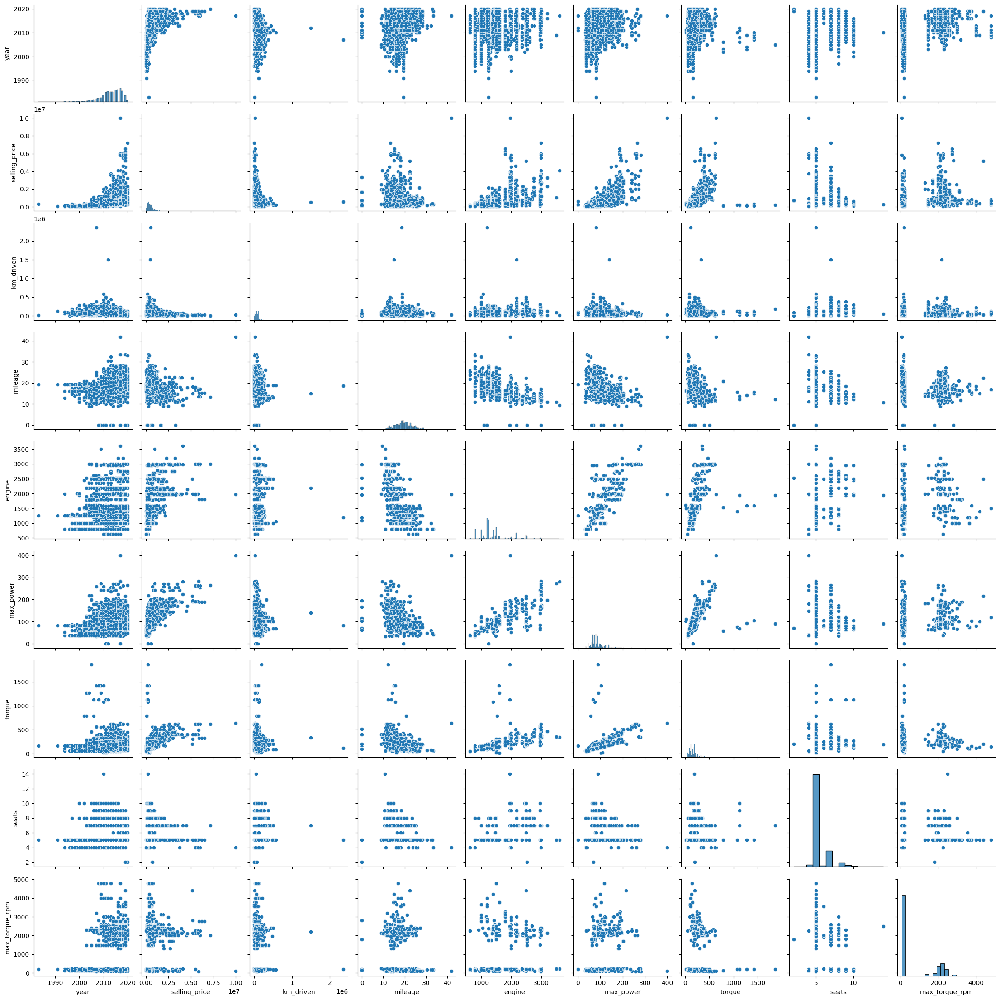

In [9]:
sns.pairplot(df_train)

 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 
 Да, можно, так как у нас есть графики где по одной оси находиться `selling_price`, а значит можно посмотреть распределение

 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

 Можно, но для получения, числовых значений корреляции, нужно посчитать коэффициенты корреляции, а также представить их в виде тепловой карты (для удобства)

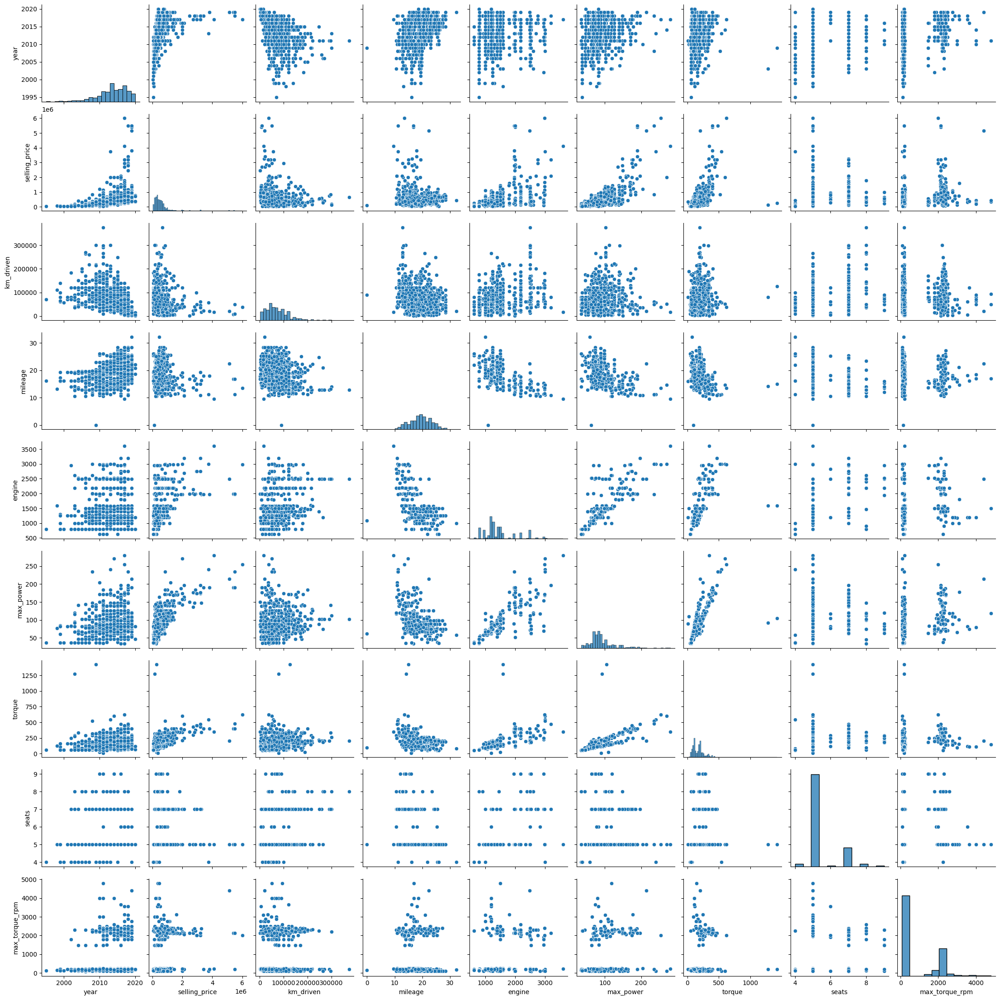

In [10]:
sns.pairplot(df_test)

- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

Да, судая по графикам pairplot совокупности обеих выборок оказались похоже

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

<Axes: >

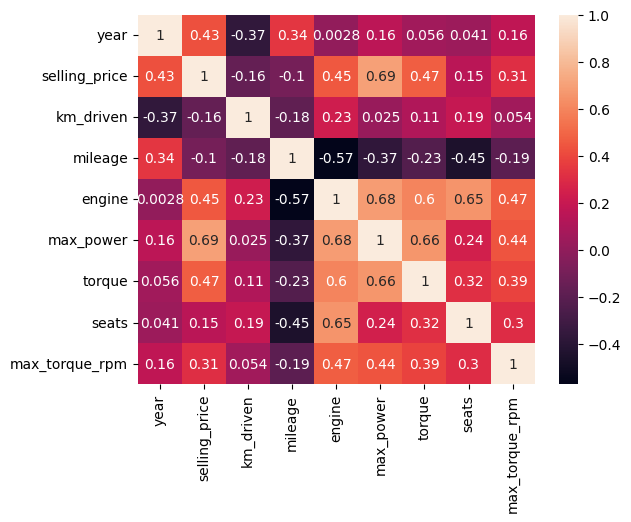

In [11]:
sns.heatmap(df_train.corr(numeric_only=True),annot=True)

In [17]:
correlation_pairs = df_train.corr(numeric_only=True).unstack().sort_values(ascending=False)
most_correlated = correlation_pairs[correlation_pairs.index.get_level_values(0) != correlation_pairs.index.get_level_values(1)]
print("Наименее коррелирующие пары признаков:")
print(most_correlated.tail(1))
print("Наиболее коррелирующие пары признаков:")
print(most_correlated.head(1))

Наименее коррелирующие пары признаков:
engine  mileage   -0.572893
dtype: float64
Наиболее коррелирующие пары признаков:
selling_price  max_power    0.692814
dtype: float64


- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 
    engine и mileage (-0.572)
 - Между какими наблюдается довольно сильная положительная линейная зависимость?

    selling_price и max_power (0.698)
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

   Нет, так как по тепловой карте видно, что признак year и km_driven коррелируют в обратной пропорциональности (-0.37), следовательно, чем старше машина (год меньше), тем больше км она проехала

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


Корреляция Спирмена (ручная реализация):


<Axes: >

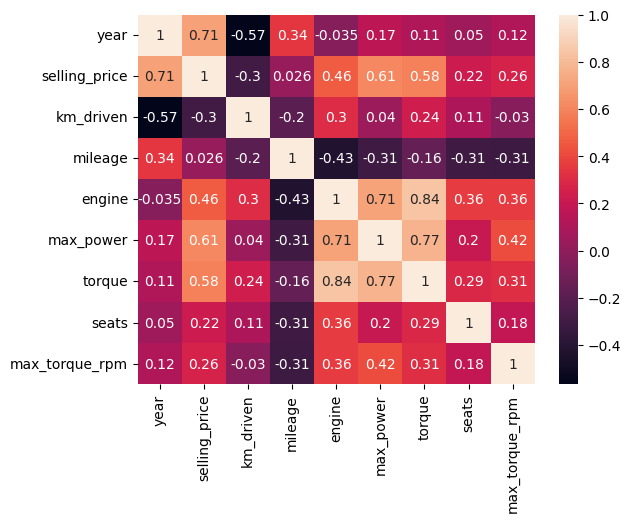

In [23]:
def spearman_corr(x, y):
    rank_x = np.argsort(np.argsort(x))
    rank_y = np.argsort(np.argsort(y))
    
    d = rank_x - rank_y
    n = len(x)
    
    result = 1 - (6 * np.sum(d**2)) / (n * (n**2 - 1))
    return result

def spearman_corr_matrix(df):
    n = df.shape[1]
    corr_matrix = np.zeros((n, n))
    columns = df.columns

    for i in range(n):
        for j in range(n):
            corr_matrix[i, j] = spearman_corr(df[columns[i]], df[columns[j]])
    
    return pd.DataFrame(corr_matrix, columns=columns, index=columns)

print("Корреляция Спирмена (ручная реализация):")
display(sns.heatmap(spearman_corr_matrix(df_train.select_dtypes(include="number")),annot=True))



Корреляция Спирмена (pandas)


<Axes: >

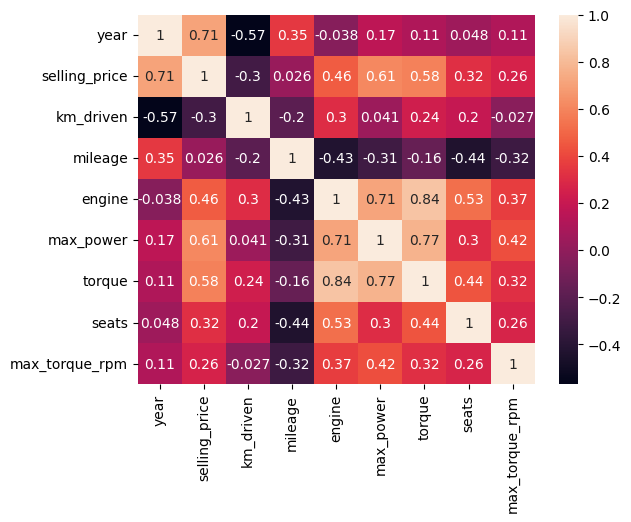

In [24]:
print("Корреляция Спирмена (pandas)")
display(sns.heatmap(df_train.corr('spearman',numeric_only=True),annot=True))

Результаты корреляций ручной и библиотечной реализации корреляции Спирмена различаются, но в основном незначительно (~0,1)

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


d:\code\python3.11\lib\site-packages\phik\data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


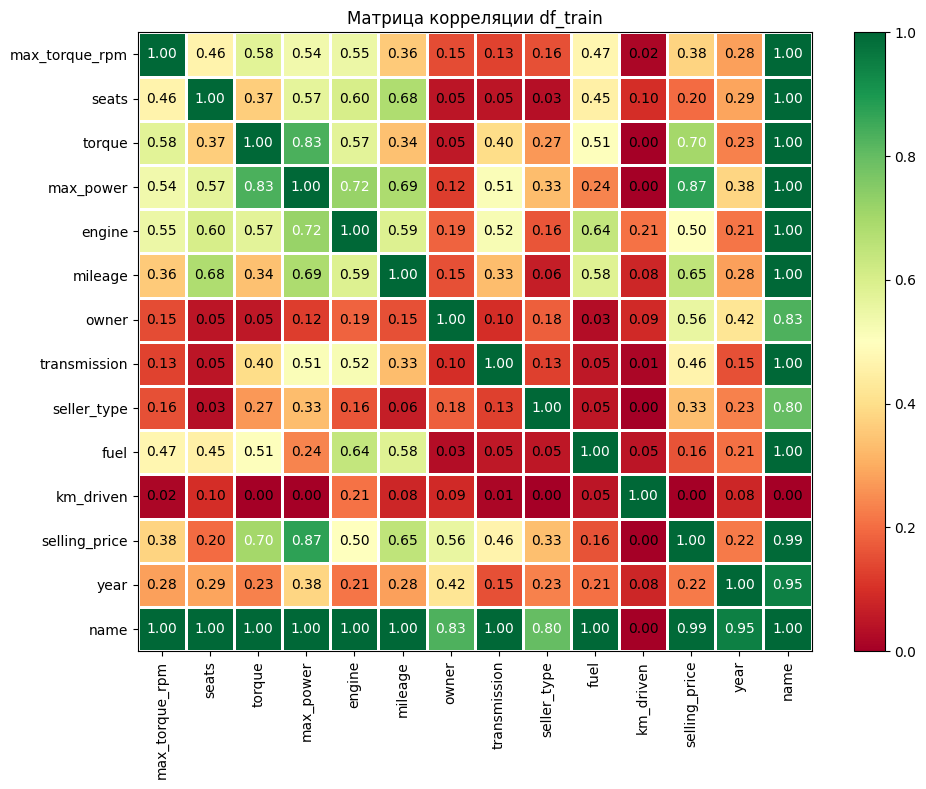

In [105]:
phik_corr_matrix = df_train.phik_matrix()
plot_correlation_matrix(phik_corr_matrix.values, x_labels=phik_corr_matrix.columns, y_labels=phik_corr_matrix.index, figsize=(10, 8), vmin=0, vmax=1)
plt.title("Матрица корреляции df_train")
plt.show()

В отличии от обычной корреляции в pandas, здесь представленны помимо числовых признаков еще и категориальные. Коэффициенты корреляции для одинаковых числовых признаков реализованных через библиотеку phink и через pandas, различаются. Помимо прочего, phink не учитывает обратную линейную зависимость.

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

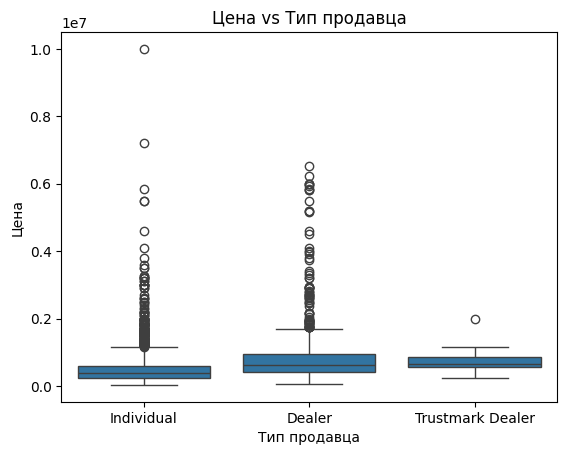

In [125]:
# 1. Зависимость цены от типа продавца
sns.boxplot(df_train, x='seller_type', y='selling_price')
plt.title('Цена vs Тип продавца')
plt.xlabel('Тип продавца')
plt.ylabel('Цена')
plt.show()

График показывает, что автомобили, продаваемые индивидуальными продавцами дешевле. 
* Индивидуальные продавцы не накладывают такие наценки, как автодилеры, что приводит к более низким ценам.
* Продавцы-индивидуалы могут не предлагать гарантии или сервисного обслуживания, что снижает стоимость автомобиля. Дилеры, в свою очередь, часто предлагают дополнительные гарантии, сервисное обслуживание и техническую проверку автомобиля, что повышает цену.
* Покупатели могут быть менее уверены в честности индивидуальных продавцов, что также влияет на цену.

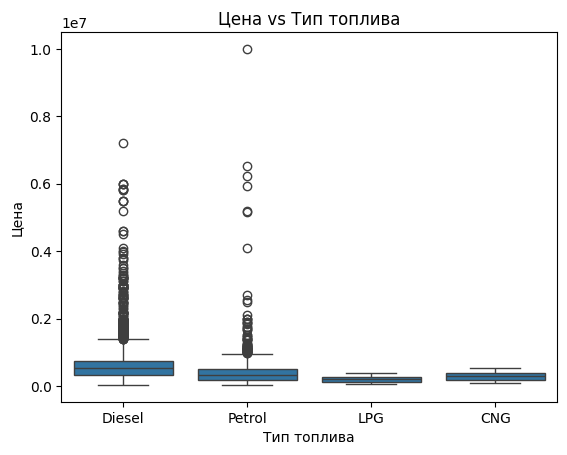

In [124]:
# 2. Зависимость цены от типа топлива
sns.boxplot(df_train, x='fuel', y='selling_price')
plt.title('Цена vs Тип топлива')
plt.xlabel('Тип топлива')
plt.ylabel('Цена')
plt.show()

На графике видно, что автомобили с дизельными двигателями в среднем имеют более высокие цены по сравнению с бензиновыми.
* Дизельные автомобили обычно более экономичны, так как дизельное топливо стоит дешевле и расходуется более эффективно, что делает их привлекательными для дальнобойных путешествий и ежедневных поездок.
* Дизельные двигатели часто имеют большую долговечность, что может повлиять на цену.
* В некоторых странах дизельные автомобили облагаются более высокими налогами или требуют дополнительных мер по соблюдению экологических стандартов, что также может отразиться на цене.

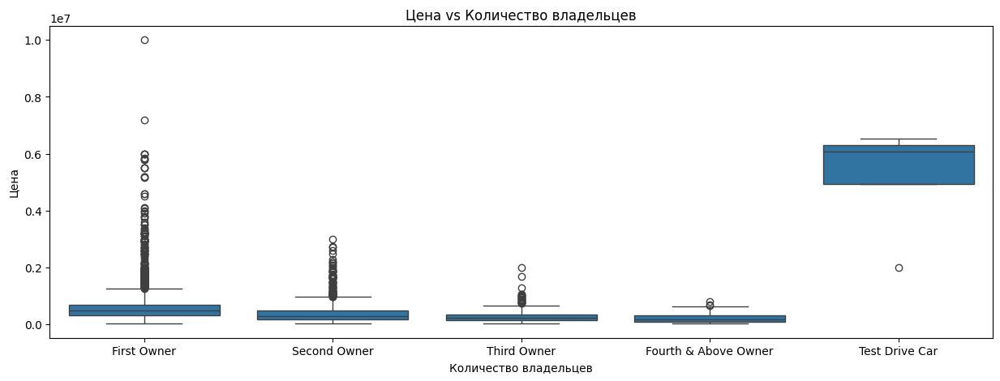

In [126]:
# 3. Зависимость цены от количества владельцев
plt.figure(figsize=(15,5))
sns.boxplot(df_train, x='owner', y='selling_price')
plt.title('Цена vs Количество владельцев')
plt.xlabel('Количество владельцев')
plt.ylabel('Цена')
plt.show()

Видно, что автомобили с меньшим количеством владельцев  стоят дороже.
* Чем меньше владельцев, тем меньше вероятность, что автомобиль подвергался жесткой эксплуатации или серьезным ремонтом. Первый владелец обычно поддерживает автомобиль в лучшем состоянии, и это делает её более ценной.
* Автомобили с одним владельцем могут иметь четкую и прозрачную историю, что привлекает покупателей. Напротив, машины с несколькими владельцами могут вызывать сомнения относительно их состояния.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [106]:
df_train_num = df_train.select_dtypes(include=['number']).copy()
X = df_train_num.drop('selling_price',axis=1)
y = df_train_num['selling_price']
X_train,X_val,y_train,y_val = train_test_split(X,y,test_size=0.25,random_state=42)

In [ ]:
# Я предобработал колонку torque, поэтому колонок 8
assert X_train.shape == (5840, 6)

In [107]:
df_test_num = df_test.select_dtypes(include=['number']).copy()
X_test = df_test_num.drop('selling_price',axis=1)
y_test = df_test_num['selling_price']

In [ ]:
assert X_test.shape == (1000, 6)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [108]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr1= LinearRegression()
lr1.fit(X_train,y_train)
print('R2 и MSE для валидационной выборки \n')
print('R2',r2_score(y_val,lr1.predict(X_val)))
print('MSE',MSE(y_val,lr1.predict(X_val)))
print('-'*50)
print('R2 и MSE для тестовой выборки \n')
print('R2',r2_score(y_test,lr1.predict(X_test)))
print('MSE',MSE(y_test,lr1.predict(X_test)))

R2 и MSE для валидационной выборки 

R2 0.57610593639368
MSE 139625732885.65927
--------------------------------------------------
R2 и MSE для тестовой выборки 

R2 0.5899040258000858
MSE 235734876522.4774


### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [29]:
def my_r2(y_true,y_pred):
    return 1-(sum((y_true-y_pred)**2)/(sum((y_true-np.average(y_true))**2)))

In [30]:
print('R2 по валдиационной выборке',my_r2(y_val,lr1.predict(X_val)))
print('R2 по тестовой выборке',my_r2(y_test,lr1.predict(X_test)))

R2 по валдиационной выборке 0.5761059363936806
R2 по тестовой выборке 0.5899040258000855




### Компоненты:

1. **\( y\_true \)**:
   - Входной массив истинных значений целевой переменной.

2. **\( y\_pred \)**:
   - Входной массив предсказанных моделью значений.
3. **np.average(y_true)**:
   - Вычисляет среднее значение истинных данных 
### Итог:
- Функция возвращает \( R^2 \), где:
  - \( R^2 = 1 \): Модель идеально предсказывает.
  - \( R^2 = 0 \): Модель не лучше среднего значения.
  - \( R^2 < 0 \): Модель хуже среднего значения.

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
# your code here

`Your answer here`

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [110]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_val= scaler.transform(X_val)
X_test=scaler.transform(X_test)

In [111]:
lr2= LinearRegression()
lr2.fit(X_train,y_train)
print('После стандартизации')
print('R2 и MSE для валидационной выборки \n')
print('R2',r2_score(y_val,lr2.predict(X_val)))
print('MSE',MSE(y_val,lr2.predict(X_val)))
print('-'*50)
print('R2 и MSE для тестовой выборки \n')
print('R2',r2_score(y_test,lr2.predict(X_test)))
print('MSE',MSE(y_test,lr2.predict(X_test)))

После стандартизации
R2 и MSE для валидационной выборки 

R2 0.5761059363936777
MSE 139625732885.66006
--------------------------------------------------
R2 и MSE для тестовой выборки 

R2 0.5899040258000849
MSE 235734876522.47787


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [33]:
coef = lr2.coef_
d = {}
for feature, coef in zip(df_train.columns, coef):
    d[feature]=coef

print(f'Признак {max(d,key=lambda x: abs(d[x]))} имеет максимальное по модулю значение: {max(d.values(), key=abs)}')


Признак fuel имеет максимальное по модулю значение: 272937.2296741178


### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
from sklearn.linear_model import Lasso

lasso = Lasso(random_state=42)
lasso.fit(X_train,y_train)
print('R2 и MSE для валидационной выборки \n')
print('R2',r2_score(y_val,lasso.predict(X_val)))
print('MSE',MSE(y_val,lasso.predict(X_val)))
print('-'*50)
print('R2 и MSE для тестовой выборки \n')
print('R2',r2_score(y_test,lasso.predict(X_test)))
print('MSE',MSE(y_test,lasso.predict(X_test)))

После стандартизации и преминения регуляризации
R2 и MSE для обучающей выборки 

R2 0.5761063502170203
MSE 139625596577.10458
--------------------------------------------------
R2 и MSE для тестовой выборки 

R2 0.5899027949409545
MSE 235735584055.454


In [35]:
coefficients = lasso.coef_
non_zero_coefficients = sum(coefficients != 0)
total_coefficients = len(coefficients)

print(f"Всего коэффициентов: {total_coefficients}")
print(f"Ненулевые коэффициенты: {non_zero_coefficients}")
print(f"Занулено коэффициентов: {total_coefficients - non_zero_coefficients}")

Всего коэффициентов: 8
Ненулевые коэффициенты: 8
Занулено коэффициентов: 0


Модель не занулила ни один из признаков, так как судя по всему они вносят значимый вклад в прогнозировании цены

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:

 
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [90]:
X_train=df_train_num.drop('selling_price',axis=1)
y_train=df_train_num['selling_price']
X_test=df_test_num.drop('selling_price',axis=1)
y_test=df_test_num['selling_price']

In [91]:
scaler2 = StandardScaler()
X_train=scaler2.fit_transform(X_train)
X_test=scaler2.transform(X_test)

In [92]:
from sklearn.model_selection import GridSearchCV

param_grid = {'alpha': list(np.arange(1, 100000, 100))}
grid = GridSearchCV(Lasso(),param_grid=param_grid,cv=10,scoring='r2')

grid.fit(X_train,y_train)
best_lasso = grid.best_estimator_
best_alpha = grid.best_params_['alpha']

print(f"Лучшее значение alpha: {best_alpha}")
print(f"R^2 на тестовом наборе: {best_lasso.score(X_test, y_test):.3f}")

lasso_best_model = grid.best_estimator_

zeroed_coeffs_indices = np.where(lasso_best_model.coef_ == 0)[0]
zeroed_coeffs_features = df_train_num.columns[zeroed_coeffs_indices]

print(f"Занулены следующие признаки: {zeroed_coeffs_features.tolist()}")

Лучшее значение alpha: 24101
R^2 на тестовом наборе: 0.567
Занулены следующие признаки: ['km_driven', 'mileage', 'torque', 'seats']


 - Сколько грид-сёрчу пришлось обучать моделей?
 
 25.7 секунды
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? 
 
 `alpha`: коэффициент, показывающий насколько сильно мы применяем регуляризацию к модели

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей? 15.4 секунды
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [94]:
from sklearn.linear_model import ElasticNet

param_grid = {
        'alpha': np.arange(10000, 30000, 1000),
        'l1_ratio': np.linspace(0.01, 1, 30)
}
 
grid_search = GridSearchCV(ElasticNet(max_iter=10000, random_state=42), param_grid=param_grid, 
                           scoring='r2', cv=10,)

grid_search.fit(X_train, y_train)
best_elastic = grid_search.best_estimator_
best_alpha_elastic = grid_search.best_params_['alpha']
best_l1_ratio_elastic = grid_search.best_params_['l1_ratio']
print(f"Лучшее значение alpha: {best_alpha_elastic:.3f}")
print(f"Лучшее значение l1_ratio: {best_l1_ratio_elastic:.3f}")
print(f"R^2 на тестовом наборе: {best_elastic.score(X_test, y_test):.3f}")

Лучшее значение alpha: 24000.000
Лучшее значение l1_ratio: 1.000
R^2 на тестовом наборе: 0.568


### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
# your code here

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [96]:
df_train_cat=df_train.copy()
df_test_cat=df_test.copy()

In [97]:
df_train_cat['name'] = df_train_cat['name'].apply(lambda x: 'Land Rover' if x == 'Land' else x.split()[0])

In [98]:
df_test_cat['name'] = df_test_cat['name'].apply(lambda x: 'Land Rover' if x == 'Land' else x.split()[0])

In [ ]:
assert X_train_cat.shape == (5840, 11)

### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [99]:
means = df_train_cat.groupby('name')['selling_price'].mean()
df_train_cat['name'] = df_train_cat['name'].map(means)
df_test_cat['name'] = df_test_cat['name'].map(means).fillna(means.mean())

In [100]:
df_train_cat=pd.get_dummies(df_train_cat,columns=[ 'fuel', 'seller_type', 'transmission', 'owner'],drop_first=True,dtype=int)
df_test_cat=pd.get_dummies(df_test_cat,columns=[ 'fuel', 'seller_type', 'transmission', 'owner'],drop_first=True,dtype=int)

In [102]:
X_train_cat=df_train_cat.drop('selling_price',axis=1)
y_train_cat=df_train_cat['selling_price']
X_test_cat=df_test_cat.drop('selling_price',axis=1)
y_test_cat=df_test_cat['selling_price']

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?

Кодирование нужно проводить после разделения датасета. Кодировать нужно обе части датасета, а также нужно удалять один из закодированных столбцов.

* Почему мы удаляем один столбец?

При использовании OHE, удаляя один из столбцов, категории которую мы закодировали мы избегаем мультиколлинеарности, из-за линейной зависимости закодированных столбцов. Это позволяет снизить размерность датасета улучшает качество прогнозирования модели.

* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

Если признаки оказались не важными по весам модели, то стоит их детальнее проверить в части EDA и важности для заказчика (например бизнес) и только поле этого удалять. Удаление позволит сократить размерность, что может улучшить качество модели

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

Да, удалось улучшить качество прогноза (на ~20%), L2 регуляризация в сочетании с кодированием категориальных признаков методами OneHotEncoding и MeanTargetEncoding и без стандартизации оказалась более преспективной чем L1,ElasticNet и стандартизация линейной регрессии

In [103]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

param_grid = {
        'alpha': list(np.linspace(0.01, 100, 50)),
}
 
grid_search_ridge = GridSearchCV(Ridge(random_state=42), param_grid=param_grid, 
                           scoring='r2', cv=10,)

grid_search_ridge.fit(X_train_cat, y_train_cat)
best_ridge = grid_search_ridge.best_estimator_
best_alpha_ridge = grid_search_ridge.best_params_['alpha']
print(f"Лучшее значение alpha: {best_alpha_ridge:.3f}")
print(f"R^2 на тестовом наборе: {best_ridge.score(X_test_cat, y_test_cat):.3f}")


Лучшее значение alpha: 0.010
R^2 на тестовом наборе: 0.773


# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [ ]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [79]:
def business_metrics(y_true, y_pred):
    count =0
    for i in range(len(y_true)):
        if (abs(y_true[i]-y_pred[i])/y_true[i])<=0.1:
            count+=1 
    return count/len(y_pred) 

In [ ]:
print(f'Линейная регрессиия: {business_metrics(y_test,lr1.predict(X_test))}')

Линейная регрессиия: 0.216


In [87]:
print(f'Линейная регрессиия + стандартизация: {business_metrics(y_test,lr2.predict(X_test))}')

Линейная регрессиия + стандартизация: 0.216


In [89]:
print(f'L1-регуляризация: {business_metrics(y_test,lr2.predict(X_test))}')

L1-регуляризация: 0.216


In [93]:
print(f'L1-регуляризация + GridSearchCV: {business_metrics(y_test,lasso_best_model.predict(X_test))}')

L1-регуляризация + GridSearchCV: 0.232


In [95]:
print(f'ElasticNet + GridSearchCV: {business_metrics(y_test,best_elastic.predict(X_test))}')

ElasticNet + GridSearchCV: 0.232


In [104]:
print(f'L2-регуляризация + GridSearchCV: {business_metrics(y_test_cat,best_ridge.predict(X_test_cat))}')

L2-регуляризация + GridSearchCV: 0.247


Бизнесовую задачу лучше всего решает модель с L2-регуляризацией+GridSearchCV

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [ ]:
def your_business_metrics(y_true, y_pred):

business_metrics(# your code here)

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List
app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>